# Define the problem 

Predicting house sale prices is a regression problem. 

In [1]:
#import libraries 

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.graph_objs as go
import plotly as py
import plotly.express as px

In [2]:
# load training data 

train_data = pd.read_csv(r"C:\Users\Krupa\Downloads\train.csv")
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
train_data.shape

(1460, 81)

The test data consists of various property information, ranging from plot size to the type of foundation it is built on. In total there are 79 property features. 

In [4]:
# summarise /check test data 

def check_data(df):
    summary = [
        [col, df[col].dtype, df[col].count(), df[col].nunique(), df[col].isnull().sum(), df.duplicated().sum()]
        for col in df.columns] 
    
    df_check = pd.DataFrame(summary, columns = ['column', 'dtype', 'instances', 'unique', 'missing_vals', 'duplicates'])
    pd.set_option('display.max_rows', None),
    pd.set_option('display.max_columns', None),
    pd.set_option('display.precision', 3)
                       
    return df_check

In [5]:
check_data(train_data)

,column,dtype,instances,unique,missing_vals,duplicates
0,Id,int64,1460,1460,0,0
1,MSSubClass,int64,1460,15,0,0
2,MSZoning,object,1460,5,0,0
3,LotFrontage,float64,1201,110,259,0
4,LotArea,int64,1460,1073,0,0
5,Street,object,1460,2,0,0
6,Alley,object,91,2,1369,0
7,LotShape,object,1460,4,0,0
8,LandContour,object,1460,4,0,0
9,Utilities,object,1460,2,0,0


In [6]:
print('Unique Values in Alley Column:', train_data['Alley'].unique(),  
    '%\nUnique Values in Pool Quality Column:',train_data['PoolQC'].unique(), 
    '%\nUnique Values in Fence Column:',train_data['Fence'].unique(),
    '%\nUnique Values in Miscellaneous Feature Column:',train_data['MiscFeature'].unique())

Unique Values in Alley Column: [nan 'Grvl' 'Pave'] %
Unique Values in Pool Quality Column: [nan 'Ex' 'Fa' 'Gd'] %
Unique Values in Fence Column: [nan 'MnPrv' 'GdWo' 'GdPrv' 'MnWw'] %
Unique Values in Miscellaneous Feature Column: [nan 'Shed' 'Gar2' 'Othr' 'TenC']


The columns with over 1000 missing values are:- 

    - Alley : describes the type of alley access (i.e. Gravel, paving or no alley access)
    - PoolQC : rated Excellent, Good, Average/Typical, Fair or No pool  
    - Fence : rated Good Privacy, Minimum Privacy, Good Wood, Minimum Wood/Wire or No Fence
    - MiscFeature : indicates if there are additional features such as an elevator, shed (over 100sq/ft), second garage, tennis court, other or none 

In [7]:
# let's review the stats 
train_data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.00,1460.000,1201.000,1460.000,1460.000,1460.000,1460.000,1460.000,1452.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1379.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000
mean,730.50,56.897,70.050,10516.828,6.099,5.575,1971.268,1984.866,103.685,443.640,46.549,567.240,1057.429,1162.627,346.992,5.845,1515.464,0.425,0.058,1.565,0.383,2.866,1.047,6.518,0.613,1978.506,1.767,472.980,94.245,46.660,21.954,3.410,15.061,2.759,43.489,6.322,2007.816,180921.196
std,421.61,42.301,24.285,9981.265,1.383,1.113,30.203,20.645,181.066,456.098,161.319,441.867,438.705,386.588,436.528,48.623,525.480,0.519,0.239,0.551,0.503,0.816,0.220,1.625,0.645,24.690,0.747,213.805,125.339,66.256,61.119,29.317,55.757,40.177,496.123,2.704,1.328,79442.503
min,1.00,20.000,21.000,1300.000,1.000,1.000,1872.000,1950.000,0.000,0.000,0.000,0.000,0.000,334.000,0.000,0.000,334.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000,0.000,1900.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,2006.000,34900.000
25%,365.75,20.000,59.000,7553.500,5.000,5.000,1954.000,1967.000,0.000,0.000,0.000,223.000,795.750,882.000,0.000,0.000,1129.500,0.000,0.000,1.000,0.000,2.000,1.000,5.000,0.000,1961.000,1.000,334.500,0.000,0.000,0.000,0.000,0.000,0.000,0.000,5.000,2007.000,129975.000
50%,730.50,50.000,69.000,9478.500,6.000,5.000,1973.000,1994.000,0.000,383.500,0.000,477.500,991.500,1087.000,0.000,0.000,1464.000,0.000,0.000,2.000,0.000,3.000,1.000,6.000,1.000,1980.000,2.000,480.000,0.000,25.000,0.000,0.000,0.000,0.000,0.000,6.000,2008.000,163000.000
75%,1095.25,70.000,80.000,11601.500,7.000,6.000,2000.000,2004.000,166.000,712.250,0.000,808.000,1298.250,1391.250,728.000,0.000,1776.750,1.000,0.000,2.000,1.000,3.000,1.000,7.000,1.000,2002.000,2.000,576.000,168.000,68.000,0.000,0.000,0.000,0.000,0.000,8.000,2009.000,214000.000
max,1460.00,190.000,313.000,215245.000,10.000,9.000,2010.000,2010.000,1600.000,5644.000,1474.000,2336.000,6110.000,4692.000,2065.000,572.000,5642.000,3.000,2.000,3.000,2.000,8.000,3.000,14.000,3.000,2010.000,4.000,1418.000,857.000,547.000,552.000,508.000,480.000,738.000,15500.000,12.000,2010.000,755000.000


Typically, features such as:-
    
    - postcode
    - plot size
    - building type (flat, or house, terraced, semi or detached)
    - number of bedrooms and bathrooms 
    - proximity to amenities
    - proximity to schools 
    - transport links 
    - condition 

can affect the sale price of a property. 

From the stats, we can understand the following: -
    
    - The average house price is $180,921, with the cheapest being $34,900 and the most expensive being $755,000
    - The average lot size is 10,516 sq/ft
    - The oldest property built was in 1872 and the most recent property built was 2010
    - On average properties have between 2 to 3 bedrooms, with the most being 8 and the lowest being 0. 
    - The average number of bathrooms is between 1 to 2
    
    

#### Let's dive deeper into the data and do some analysis 

#### House sale price distribution 

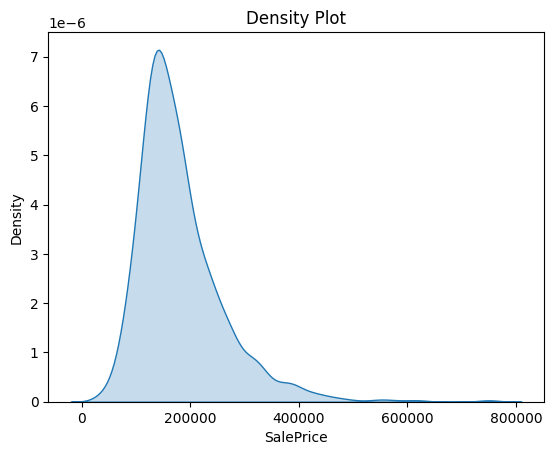

In [8]:
def density_plot(df, x_col):
    data = df
    col_name = x_col
    sns.kdeplot(data[col_name],fill=True)
    plt.title('Density Plot')
    
    return plt.show()

density_plot(train_data, 'SalePrice')


C:\Users\Krupa\AppData\Local\Temp\ipykernel_40788\2006706765.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Neighborhood',y='SalePrice',data=train_data, palette='rainbow')


Text(0.5, 1.0, 'Property Price Dsitribution by Neighborhood')

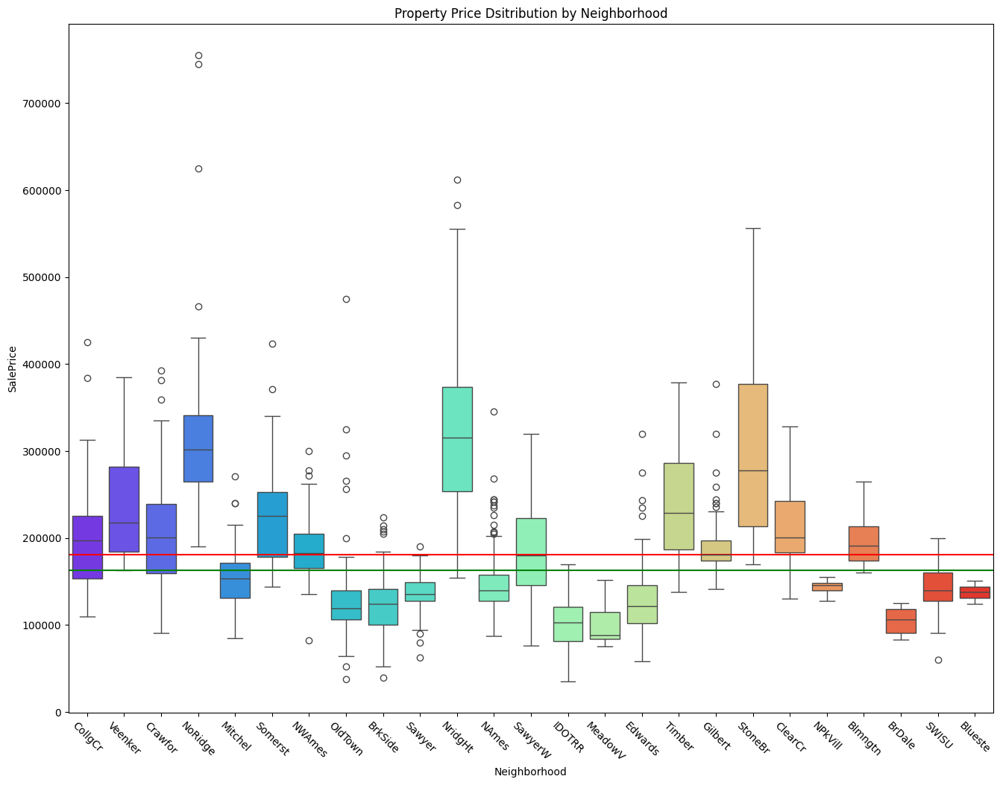

In [9]:
# how does the area affect sale price?

market_value_mean=train_data['SalePrice'].mean()
market_value_med=train_data['SalePrice'].median()
plt.figure(figsize=(16,12))
sns.boxplot(x='Neighborhood',y='SalePrice',data=train_data, palette='rainbow')
plt.xticks(rotation=-45)
plt.axhline(y=market_value_mean, color='r', linestyle='-')
plt.axhline(y=market_value_med, color='g', linestyle='-')
plt.title("Property Price Dsitribution by Neighborhood")

From the boxplots above we can see that properties sell for a lot more than average in Northridge Heights, whereas Meadow V is on the lower on end of the scale. The average sold property price is approx. 180,000

C:\Users\Krupa\AppData\Local\Temp\ipykernel_40788\1826756137.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Neighborhood',y='OverallQual',data=train_data, palette='rainbow')


Text(0.5, 1.0, 'Overall Quality of Property Dsitribution by Neighborhood')

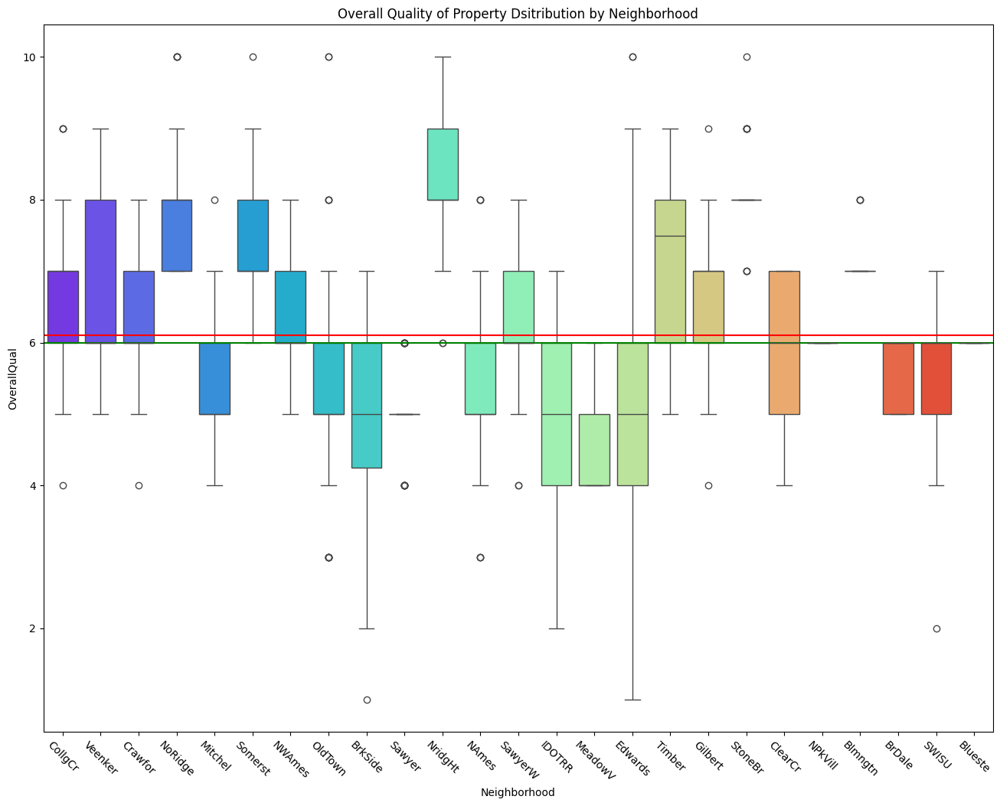

In [10]:
#is there any corr between overall qual of property and area? 

quality_value_mean=train_data['OverallQual'].mean()
quality_value_med=train_data['OverallQual'].median()
plt.figure(figsize=(16,12))
sns.boxplot(x='Neighborhood',y='OverallQual',data=train_data, palette='rainbow')
plt.xticks(rotation=-45)
plt.axhline(y=quality_value_mean, color='r', linestyle='-')
plt.axhline(y=quality_value_med, color='g', linestyle='-')
plt.title("Overall Quality of Property Dsitribution by Neighborhood")

In [11]:
#calc. number of bins to split LotArea into 

train_data_bins = train_data.copy()
train_data_bins = pd.cut(train_data_bins['LotArea'], 4)

In [12]:
train_data_bins

0        (1086.055, 54786.25]
1        (1086.055, 54786.25]
2        (1086.055, 54786.25]
3        (1086.055, 54786.25]
4        (1086.055, 54786.25]
5        (1086.055, 54786.25]
6        (1086.055, 54786.25]
7        (1086.055, 54786.25]
8        (1086.055, 54786.25]
9        (1086.055, 54786.25]
10       (1086.055, 54786.25]
11       (1086.055, 54786.25]
12       (1086.055, 54786.25]
13       (1086.055, 54786.25]
14       (1086.055, 54786.25]
15       (1086.055, 54786.25]
16       (1086.055, 54786.25]
17       (1086.055, 54786.25]
18       (1086.055, 54786.25]
19       (1086.055, 54786.25]
20       (1086.055, 54786.25]
21       (1086.055, 54786.25]
22       (1086.055, 54786.25]
23       (1086.055, 54786.25]
24       (1086.055, 54786.25]
25       (1086.055, 54786.25]
26       (1086.055, 54786.25]
27       (1086.055, 54786.25]
28       (1086.055, 54786.25]
29       (1086.055, 54786.25]
30       (1086.055, 54786.25]
31       (1086.055, 54786.25]
32       (1086.055, 54786.25]
33       (

In [13]:
train_data['LotArea'].min()

1300

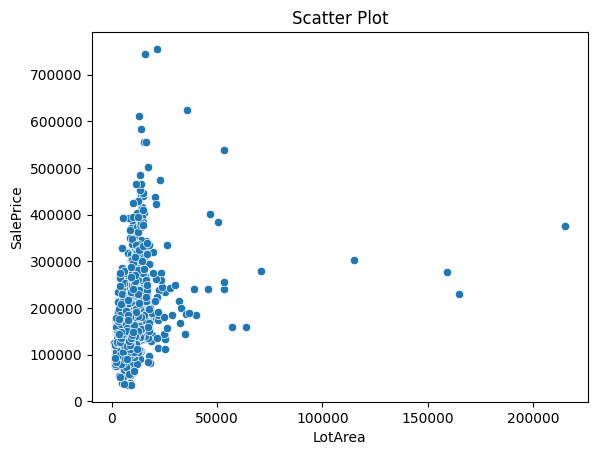

In [14]:
# is there any corr between the size of property and sold price ?

def scatter_plot(df, x_col, y_col):
    sns.scatterplot(x=x_col, y=y_col, data=df)
    plt.title('Scatter Plot')
    
    return plt.show()

scatter_plot(train_data, 'LotArea', 'SalePrice')

In [15]:
train_data['LotArea'].describe()

count      1460.000
mean      10516.828
std        9981.265
min        1300.000
25%        7553.500
50%        9478.500
75%       11601.500
max      215245.000
Name: LotArea, dtype: float64

In [16]:
lot_area_bins = [0, 20000, 40000, 60000, 80000, 100000, 120000, 140000, 160000, 180000, 200000, 220000, 240000]

lot_data = train_data.copy()
lot_data['LotAreaBin'] = pd.cut(lot_data['LotArea'], lot_area_bins)

In [17]:
lot_data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,LotAreaBin
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500,"(0, 20000]"
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500,"(0, 20000]"
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500,"(0, 20000]"
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000,"(0, 20000]"
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000,"(0, 20000]"
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000,"(0, 20000]"
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000,"(0, 20000]"
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000,"(0, 20000]"
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900,"(0, 20000]"
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Arte

In [18]:
mean_lot_area = train_data['LotArea'].mean()

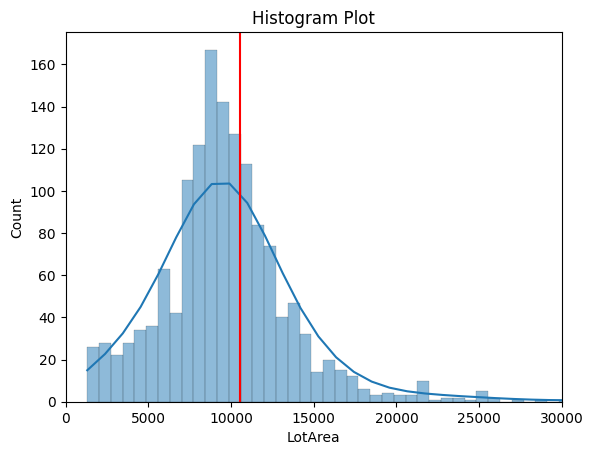

In [19]:

sns.histplot(train_data['LotArea'], kde=True)
plt.title('Histogram Plot')
plt.xlim(0,30000)    
plt.axvline(x=mean_lot_area, color='r', linestyle='-')
plt.show()


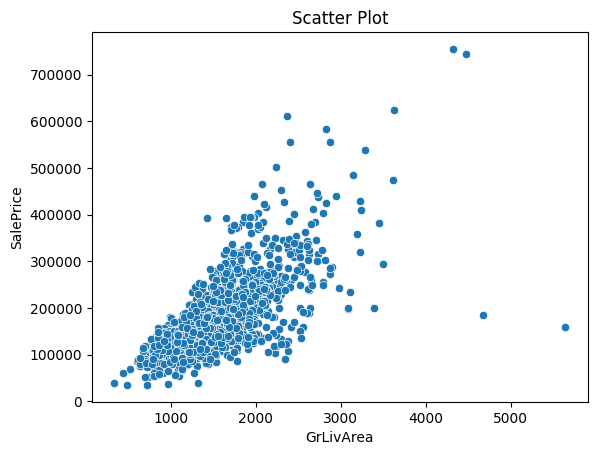

In [20]:
scatter_plot(train_data, 'GrLivArea', 'SalePrice')

In [21]:
px.scatter(train_data, x='GrLivArea', y='SalePrice', trendline='ols', trendline_color_override='red', title='GF Living Area & Property Sale Price')


In [22]:
avg_qual_score = train_data.groupby('OverallQual').SalePrice.mean()
avg_qual_score=avg_qual_score.to_frame().reset_index()
avg_qual_score

,OverallQual,SalePrice
0,1,50150.000
1,2,51770.333
2,3,87473.750
3,4,108420.655
4,5,133523.348
5,6,161603.035
6,7,207716.423
7,8,274735.536
8,9,367513.023
9,10,438588.389


In [23]:
px.scatter(avg_qual_score, x='OverallQual', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship betweeen Average Quality Score & Property Sale Price')


In [24]:
# first let's determine the average sale price for each neighbourhood listed 
nhood_avg_price= train_data.groupby('Neighborhood').SalePrice.mean().to_frame().reset_index()
nhood_avg_price=nhood_avg_price.sort_values('SalePrice', ascending=False)
nhood_avg_price

,Neighborhood,SalePrice
15,NoRidge,335295.317
16,NridgHt,316270.623
22,StoneBr,310499.000
23,Timber,242247.447
24,Veenker,238772.727
21,Somerst,225379.837
4,ClearCr,212565.429
6,Crawfor,210624.725
5,CollgCr,197965.773
0,Blmngtn,194870.882


In [25]:
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [26]:
train_data['YrSold'].unique()

array([2008, 2007, 2006, 2009, 2010], dtype=int64)

In [27]:
#change to date columns to datetime 

train_data['YearBuilt'] = pd.to_datetime(train_data['YearBuilt'], format='%Y')
train_data['YearRemodAdd'] = pd.to_datetime(train_data['YearRemodAdd'], format='%Y')
train_data['YrSold'] = pd.to_datetime(train_data['YrSold'], format='%Y')


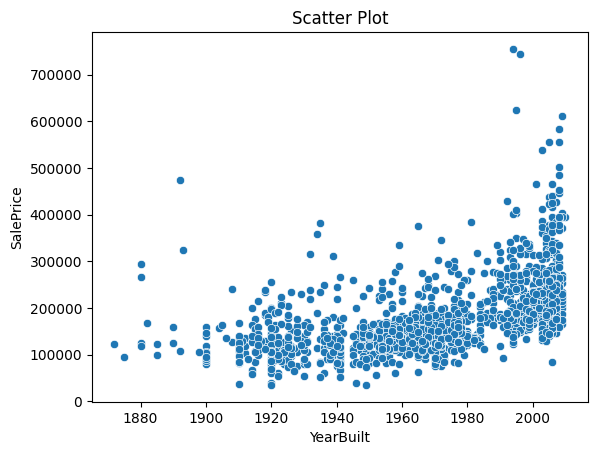

In [101]:
scatter_plot(train_data, 'YearBuilt', 'SalePrice')

In [102]:
px.scatter(train_data, x ='YearBuilt', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Year property build and Sale Price')


In [28]:
# is there any corr between age of proprty and sold price? 

train_data['PropAge'] = (train_data['YrSold'].dt.year -train_data['YearBuilt'].dt.year)

In [29]:
train_data['PropAge'].describe()

count    1460.000
mean       36.548
std        30.250
min         0.000
25%         8.000
50%        35.000
75%        54.000
max       136.000
Name: PropAge, dtype: float64

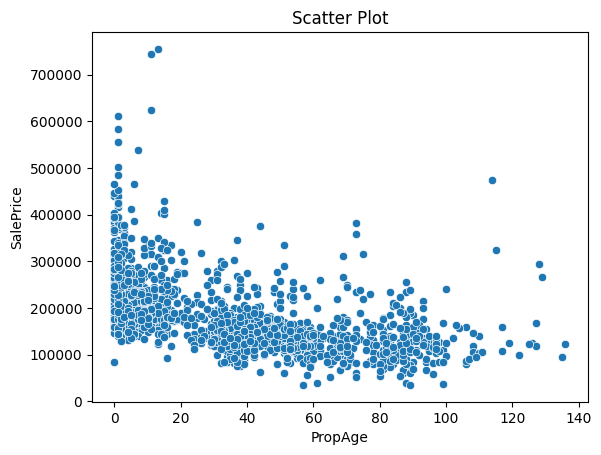

In [30]:
scatter_plot(train_data, 'PropAge', 'SalePrice')

In [31]:
px.scatter(train_data, x ='PropAge', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Property Age and Sale Price')


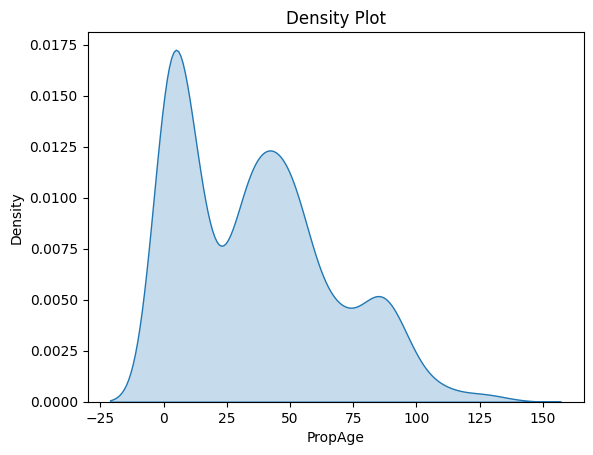

In [32]:
density_plot(train_data, 'PropAge')

#### Now let's consider the numerical data 

In [33]:
list(set(train_data.dtypes.tolist()))


[dtype('O'),
 dtype('<M8[ns]'),
 dtype('float64'),
 dtype('int32'),
 dtype('int64')]

In [34]:
num_data = train_data.select_dtypes(include = ['float64', 'int64'])
num_data.head()


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice
0,1,60,65.0,8450,7,5,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,208500
1,2,20,80.0,9600,6,8,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,181500
2,3,60,68.0,11250,7,5,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,223500
3,4,70,60.0,9550,7,5,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,140000
4,5,60,84.0,14260,8,5,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,250000


#### Let's plot the distribution for all numerical data 

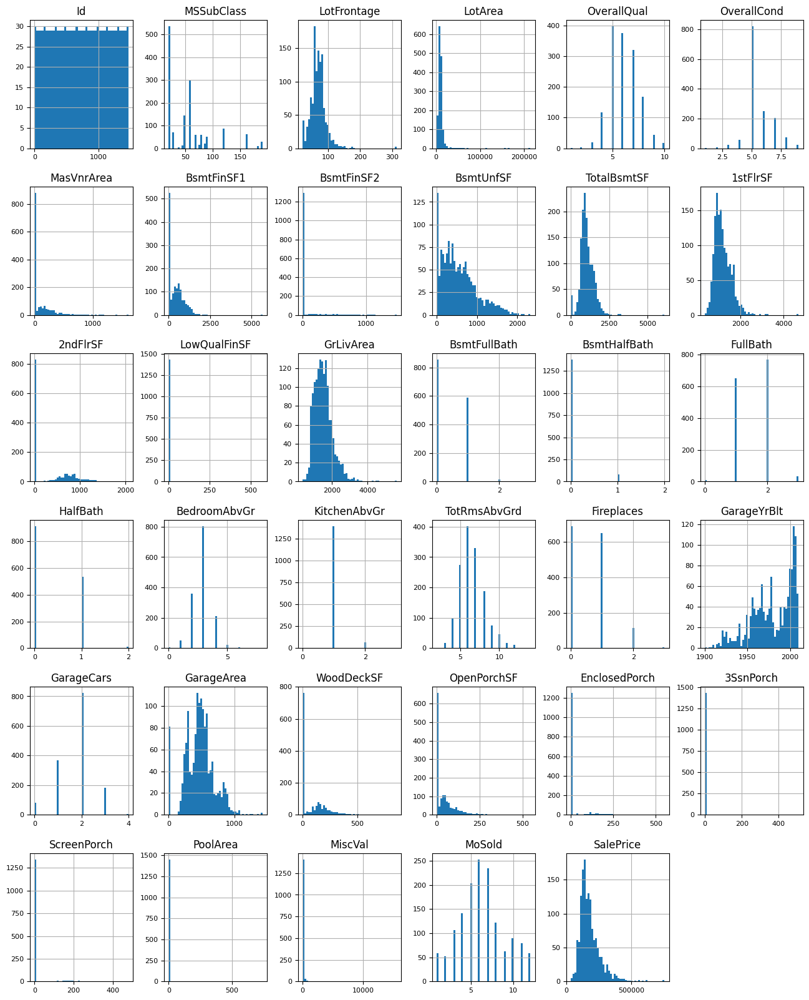

In [35]:
num_data.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);


From the above density plots we can make the following statements: -
    
    - homebuilding has grown steadily since the early 1900s and hit a peak in the early 2000's 
    - 
    - garages became more popular from the 1920s and have steadily grown 

In [36]:
num_data['SalePrice'].describe()

count      1460.000
mean     180921.196
std       79442.503
min       34900.000
25%      129975.000
50%      163000.000
75%      214000.000
max      755000.000
Name: SalePrice, dtype: float64

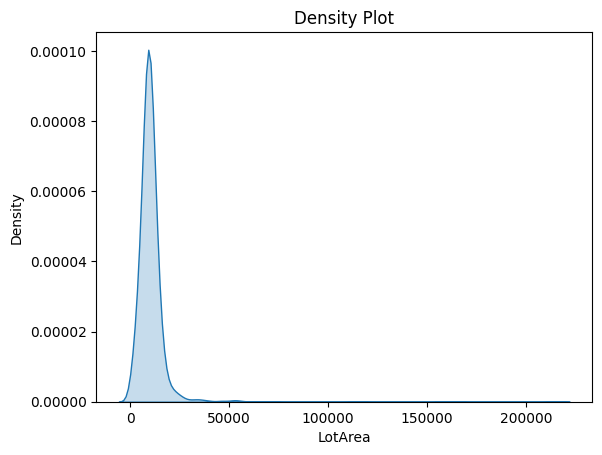

In [37]:
#let's take a closer look at the data ...

#LotArea

density_plot(num_data, 'LotArea')

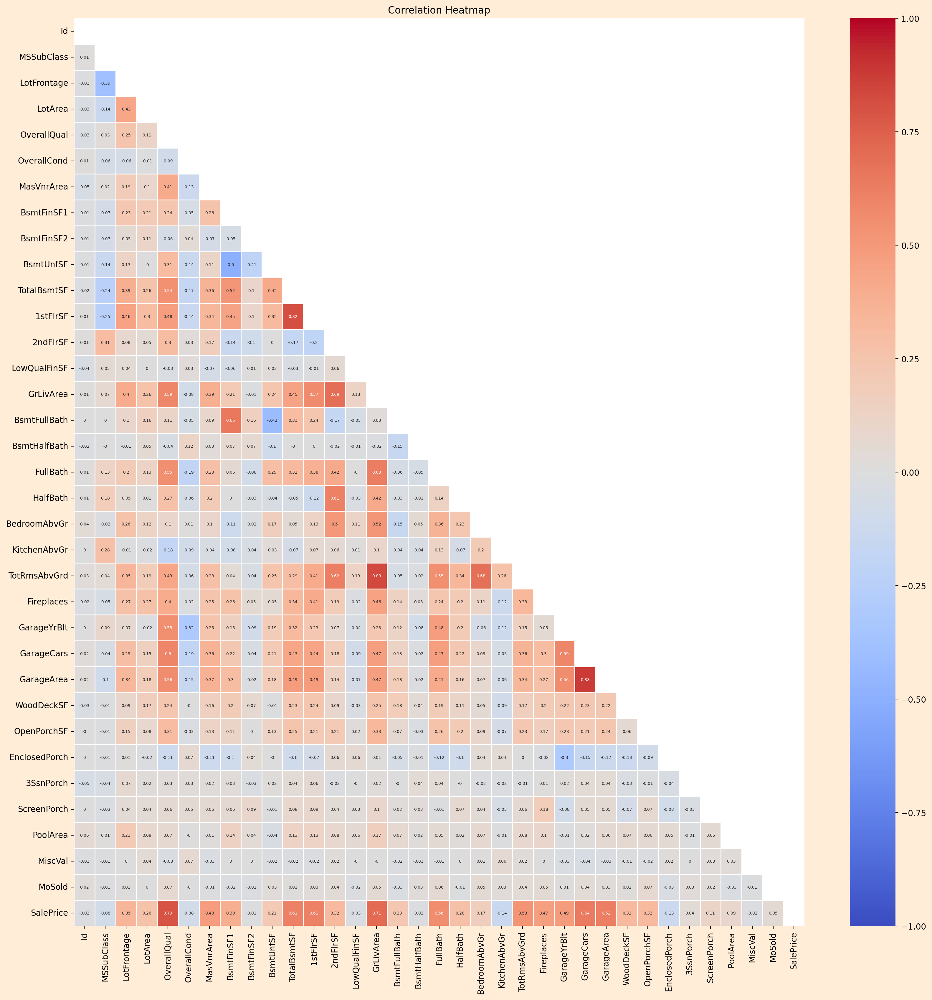

In [38]:
# can we identify any correlations between house sale prices and numeric data? 


fig = plt.figure(figsize=(20,20), facecolor = '#FFEDD8', dpi= 200)
correlation_matrix = num_data.corr().round(2)
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

sns.heatmap(correlation_matrix, vmin=-1, vmax=1, annot=True, annot_kws={"size": 5}, cmap='coolwarm', mask=mask, linewidths=0.5)
plt.title('Correlation Heatmap')

plt.show()

#correlation_heatmap(num_data)


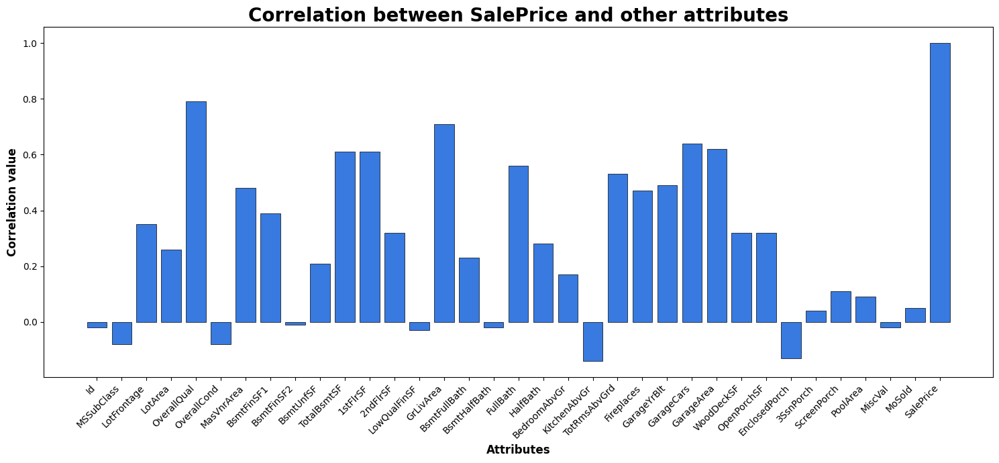

In [39]:
correlation_values = correlation_matrix['SalePrice']
plt.figure(figsize=(15, 7))
plt.bar(correlation_values.index, correlation_values.values, color = '#387ADF', edgecolor = 'black', linewidth = 0.5)

plt.title('Correlation between SalePrice and other attributes', fontsize=20, fontweight = 'bold')
plt.xlabel('Attributes', fontsize=12, fontweight = 'bold')
plt.ylabel('Correlation value', fontsize=12, fontweight = 'bold')
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.tight_layout()
plt.show()

From the above graphs, the following features have a strong influence on sales price:- 
    
    - overall quality 
    - GF area size 
    - FF area size
    - Basement area size
    - Garage area size

In [40]:
num_data['OverallQual'].describe()

count    1460.000
mean        6.099
std         1.383
min         1.000
25%         5.000
50%         6.000
75%         7.000
max        10.000
Name: OverallQual, dtype: float64

In [41]:
num_data.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice
0,1,60,65.0,8450,7,5,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,208500
1,2,20,80.0,9600,6,8,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,181500
2,3,60,68.0,11250,7,5,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,223500
3,4,70,60.0,9550,7,5,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,140000
4,5,60,84.0,14260,8,5,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,250000


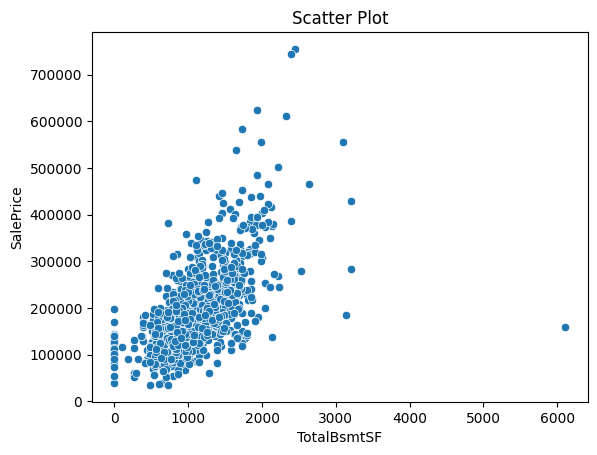

In [42]:
scatter_plot(num_data, 'TotalBsmtSF', 'SalePrice')

In [43]:
avg_bment_sft = num_data.groupby('TotalBsmtSF').SalePrice.mean().to_frame().reset_index()
avg_bment_sft

,TotalBsmtSF,SalePrice
0,0,105652.892
1,105,116000.000
2,190,91300.000
3,264,102333.333
4,270,52000.000
5,290,60000.000
6,319,89500.000
7,360,140000.000
8,372,139000.000
9,384,162842.857


In [44]:
px.scatter(avg_bment_sft, x='TotalBsmtSF', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Total Basement Areas and Average House Price Sales')


In [45]:
avg_ff_sft = num_data.groupby('1stFlrSF').SalePrice.mean().to_frame().reset_index()
avg_ff_sft

,1stFlrSF,SalePrice
0,334,39300.000
1,372,55000.000
2,438,60000.000
3,480,35311.000
4,483,96628.571
5,495,198500.000
6,520,119110.400
7,525,88000.000
8,526,91000.000
9,536,85000.000


In [46]:
px.scatter(avg_ff_sft, x='1stFlrSF', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Total First Floor Area and Average House Price Sales')


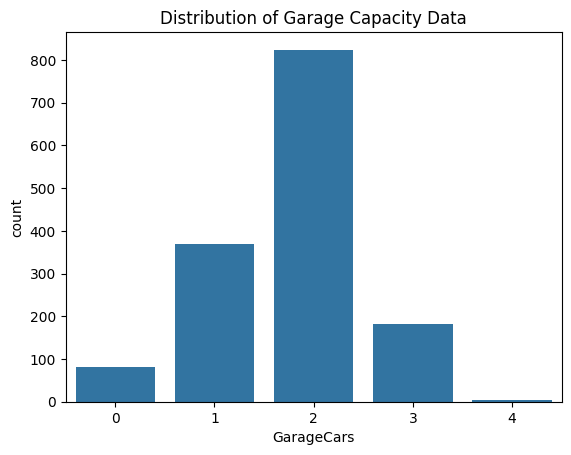

In [47]:
# size of garage in terms of capacity of number of cars 

#density_plot(num_data, 'GarageCars')
sns.countplot(num_data, x='GarageCars')
plt.title('Distribution of Garage Capacity Data')
plt.show()

In [48]:
avg_car_capacity = num_data.groupby('GarageCars').SalePrice.mean().to_frame().reset_index()
avg_car_capacity

,GarageCars,SalePrice
0,0,103317.284
1,1,128116.688
2,2,183851.664
3,3,309636.122
4,4,192655.800


In [49]:
px.scatter(avg_car_capacity, x='GarageCars', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Garage Car Capacity and Average House Price Sales')


In [50]:
avg_garage_area = num_data.groupby('GarageArea').SalePrice.mean().to_frame().reset_index()
avg_garage_area

,GarageArea,SalePrice
0,0,103317.284
1,160,89000.000
2,164,155000.000
3,180,156876.333
4,186,154900.000
5,189,78000.000
6,192,121000.000
7,198,119500.000
8,200,79125.000
9,205,108166.667


In [51]:
px.scatter(avg_garage_area, x='GarageArea', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Garage Area and Average House Price Sales')


In [52]:
#let's change the month and year sold columns to datetime values 

#num_data['MoSold'] = pd.to_datetime(num_data['MoSold'])
#num_data['YrSold'] = pd.to_datetime(num_data['YrSold'])

In [53]:
#function to create box plot

def box_plot(df, x_col, y_col):
    sns.boxplot(x=x_col, y=y_col, data=df)
    plt.title('Box Plot')
    
    return plt.show()

In [54]:
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PropAge
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003-01-01,2003-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008-01-01,WD,Normal,208500,5
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976-01-01,1976-01-01,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007-01-01,WD,Normal,181500,31
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001-01-01,2002-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008-01-01,WD,Normal,223500,7
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915-01-01,1970-01-01,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006-01-01,WD,Abnorml,140000,91
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000-01-01,2000-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008-01-01,WD,Normal,250000,8


In [55]:
train_data['YrSold'].value_counts()

YrSold
2009-01-01    338
2007-01-01    329
2006-01-01    314
2008-01-01    304
2010-01-01    175
Name: count, dtype: int64

In [56]:
#avg sales price per yr
avg_annual_sales = train_data.groupby('YrSold').SalePrice.mean()

In [57]:
avg_annual_sales = avg_annual_sales.to_frame().reset_index()

In [58]:
px.scatter(avg_annual_sales, x='YrSold', y='SalePrice', trendline='ols', trendline_color_override='red', title='Annual Average House Price Sales')


There appears to be a downward trend in property prices since 2006.

In [59]:
#avg sales price per month

avg_monthly_sales = train_data.groupby('MoSold').SalePrice.mean()
avg_monthly_sales = avg_monthly_sales.to_frame().reset_index()
px.scatter(avg_monthly_sales, x ='MoSold', y='SalePrice', trendline='ols', trendline_color_override='red', title='Monthly Average House Price Sales')


Mid to end of the year seems to be the optimal time to achieve higher sale price. 

Text(0, 0.5, 'SalePrice')

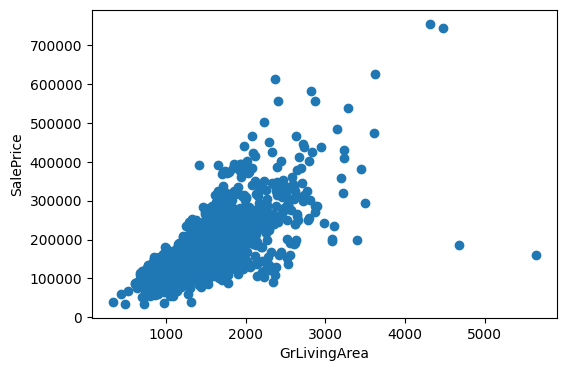

In [60]:
#how does plot size affect price?

plt.figure(figsize=(6,4))
plt.scatter(x='GrLivArea',y='SalePrice',data=num_data)
plt.xlabel('GrLivingArea')
plt.ylabel('SalePrice')

In [61]:
train_data['YrSold'].unique()

<DatetimeArray>
['2008-01-01 00:00:00', '2007-01-01 00:00:00', '2006-01-01 00:00:00',
 '2009-01-01 00:00:00', '2010-01-01 00:00:00']
Length: 5, dtype: datetime64[ns]

In [62]:
train_data['Year_Sold'] = train_data['YrSold'].dt.year
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PropAge,Year_Sold
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003-01-01,2003-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008-01-01,WD,Normal,208500,5,2008
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976-01-01,1976-01-01,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007-01-01,WD,Normal,181500,31,2007
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001-01-01,2002-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008-01-01,WD,Normal,223500,7,2008
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915-01-01,1970-01-01,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006-01-01,WD,Abnorml,140000,91,2006
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000-01-01,2000-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008-01-01,WD,Normal,250000,8,2008


In [63]:
#let's take a closer look at year sold and month sold 

sales_df = train_data.pivot_table(index='Year_Sold', columns ='MoSold', values='SalePrice', aggfunc='mean')
row_order = [2006, 2007, 2008, 2009, 2010]
sales_df = sales_df.reindex(row_order)

In [64]:
sales_df

MoSold,1,2,3,4,5,6,7,8,9,10,11,12
Year_Sold,,,,,,,,,,,,
2006,201090.000,194322.222,184982.200,174312.815,158928.289,172283.333,183211.060,196239.957,223768.867,172356.708,213285.000,185545.000
2007,183234.615,176301.750,176567.783,170772.609,169873.512,179725.814,195396.843,183941.075,195533.818,215428.812,197709.333,214414.500
2008,178504.692,159370.000,178505.278,159293.346,188334.474,169730.941,174562.653,196076.966,169626.471,166690.636,210981.059,175600.000
2009,189735.500,187450.000,171547.368,181680.769,164482.946,183260.932,197984.410,165670.967,196849.350,175206.593,156381.818,164014.533
2010,163852.600,174823.333,203181.286,171344.026,178422.250,181639.583,121750.000,NaN,NaN,NaN,NaN,NaN


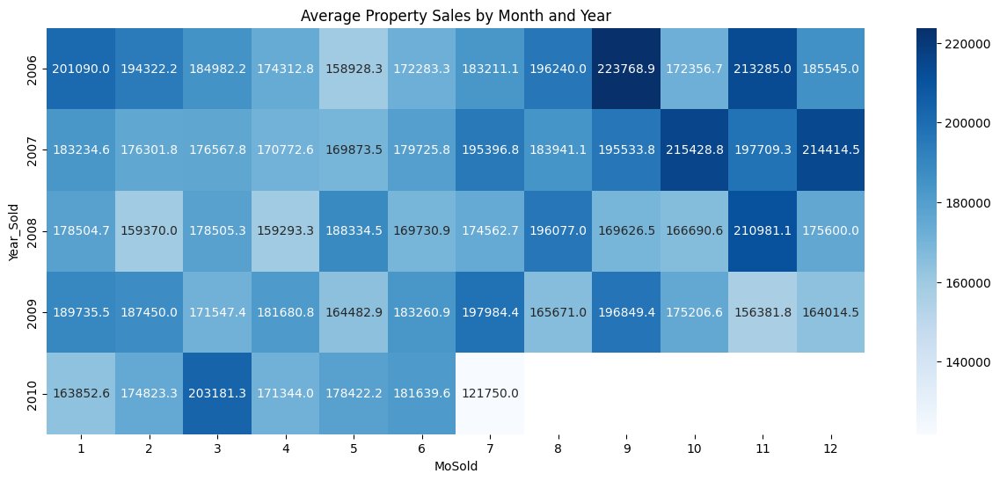

In [65]:
plt.figure(figsize=(15,6))
sns.heatmap(sales_df, cmap='Blues', annot=True, fmt='.1f')
plt.title('Average Property Sales by Month and Year')
plt.show()

In [66]:
train_data['MoSold'].unique()

array([ 2,  5,  9, 12, 10,  8, 11,  4,  1,  7,  3,  6], dtype=int64)

In [67]:
#number of beds and sale prices
avg_bed_nums = train_data.groupby('BedroomAbvGr').SalePrice.mean().to_frame().reset_index()
px.scatter(avg_bed_nums, x ='BedroomAbvGr', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Number of Bedrooms Above Ground and Average Sale Price')

In [68]:
num_data

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice
0,1,60,65.0,8450,7,5,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,208500
1,2,20,80.0,9600,6,8,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,181500
2,3,60,68.0,11250,7,5,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,223500
3,4,70,60.0,9550,7,5,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,140000
4,5,60,84.0,14260,8,5,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,250000
5,6,50,85.0,14115,5,5,0.0,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993.0,2,480,40,30,0,320,0,0,700,10,143000
6,7,20,75.0,10084,8,5,186.0,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2004.0,2,636,255,57,0,0,0,0,0,8,307000
7,8,60,NaN,10382,7,6,240.0,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973.0,2,484,235,204,228,0,0,0,350,11,200000
8,9,50,51.0,6120,7,5,0.0,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,1931.0,2,468,90,0,205,0,0,0,0,4,129900
9,10,190,50.0,7420,5,6,0.0,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1939.0,1,205,0,4,0,0,0,0,0,1,118000


In [69]:
train_data['HouseStyle'].unique()

array(['2Story', '1Story', '1.5Fin', '1.5Unf', 'SFoyer', 'SLvl', '2.5Unf',
       '2.5Fin'], dtype=object)

In [70]:
#categorical data analysis 
cat_data = train_data.copy()
common_columns = cat_data.columns.intersection(num_data.columns)

cat_data = cat_data.drop(columns=common_columns)

cat_data.head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,YrSold,SaleType,SaleCondition,PropAge,Year_Sold
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,2003-01-01,2003-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,2008-01-01,WD,Normal,5,2008
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,1976-01-01,1976-01-01,Gable,CompShg,MetalSd,MetalSd,NaN,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,2007-01-01,WD,Normal,31,2007
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,2001-01-01,2002-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,2008-01-01,WD,Normal,7,2008
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,1915-01-01,1970-01-01,Gable,CompShg,Wd Sdng,Wd Shng,NaN,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,2006-01-01,WD,Abnorml,91,2006
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,2000-01-01,2000-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,2008-01-01,WD,Normal,8,2008


In [71]:
cat_data.shape

(1460, 48)

In [72]:
cat_data.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir',
       'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC',
       'Fence', 'MiscFeature', 'YrSold', 'SaleType', 'SaleCondition',
       'PropAge', 'Year_Sold'],
      dtype='object')

In [73]:
cat_data = cat_data.drop(columns=['MSZoning', 'Alley', 'LotShape', 
                                  'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 
       'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC',
       'Fence', 'MiscFeature', 'YrSold', 'SaleType', 'SaleCondition',
       'PropAge', 'Year_Sold'])
cat_data.shape

(1460, 4)

In [74]:
# encode the cat data

encoded_cat_df = pd.get_dummies(cat_data)


In [75]:
encoded_cat_df.head()

,Street_Grvl,Street_Pave,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,CentralAir_N,CentralAir_Y
0,False,True,True,False,False,False,False,False,False,False,False,False,True,False,False,False,True
1,False,True,True,False,False,False,False,False,False,True,False,False,False,False,False,False,True
2,False,True,True,False,False,False,False,False,False,False,False,False,True,False,False,False,True
3,False,True,True,False,False,False,False,False,False,False,False,False,True,False,False,False,True
4,False,True,True,False,False,False,False,False,False,False,False,False,True,False,False,False,True


In [76]:
#concat the sale price col to encoded df

encoded_cat_df_full = pd.concat([encoded_cat_df, train_data['SalePrice']], axis=1)
encoded_cat_df_full.head()

,Street_Grvl,Street_Pave,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,CentralAir_N,CentralAir_Y,SalePrice
0,False,True,True,False,False,False,False,False,False,False,False,False,True,False,False,False,True,208500
1,False,True,True,False,False,False,False,False,False,True,False,False,False,False,False,False,True,181500
2,False,True,True,False,False,False,False,False,False,False,False,False,True,False,False,False,True,223500
3,False,True,True,False,False,False,False,False,False,False,False,False,True,False,False,False,True,140000
4,False,True,True,False,False,False,False,False,False,False,False,False,True,False,False,False,True,250000


In [77]:
encoded_cat_df_full.shape

(1460, 18)

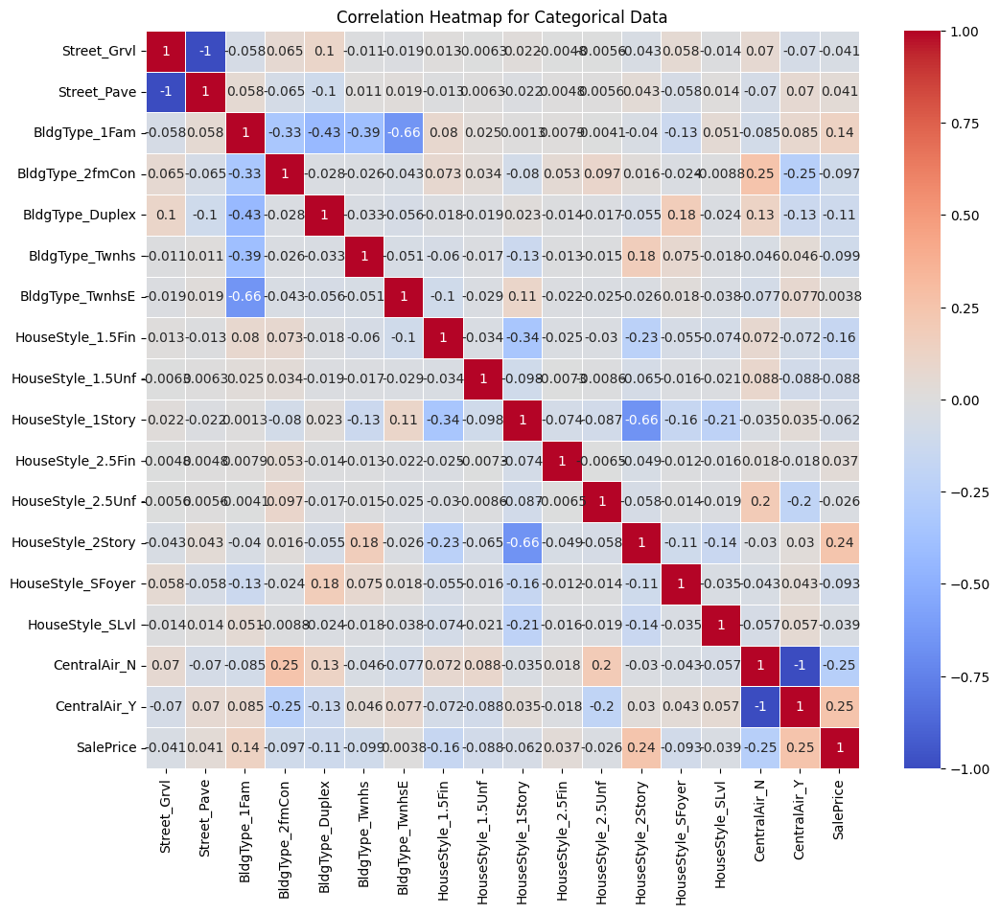

In [78]:
corr_matrix = encoded_cat_df_full.corr()
plt.figure(figsize=(12,10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap for Categorical Data")
plt.show()

In [ ]:
mean_sale_price = train_data['SalePrice'].mean
median_

Text(0.5, 1.0, 'Property Sale Price by Building Type')

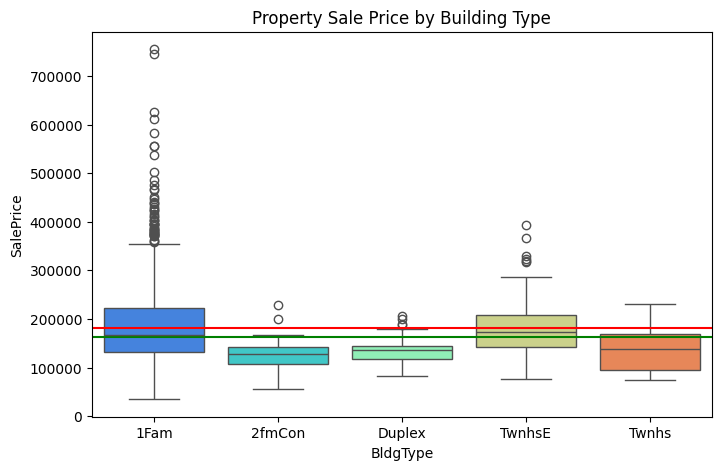

In [87]:
# sale price by bdg type 

plt.figure(figsize=(8,5))
sns.boxplot(x='BldgType', y='SalePrice', data=train_data, palette='rainbow', hue='BldgType', legend=False)
plt.axhline(y=market_value_mean, color='r', linestyle='-')
plt.axhline(y=market_value_med, color='g', linestyle='-')
plt.title('Property Sale Price by Building Type')

Text(0.5, 1.0, 'Sale Price by Building Type, Divided by Sale Type')

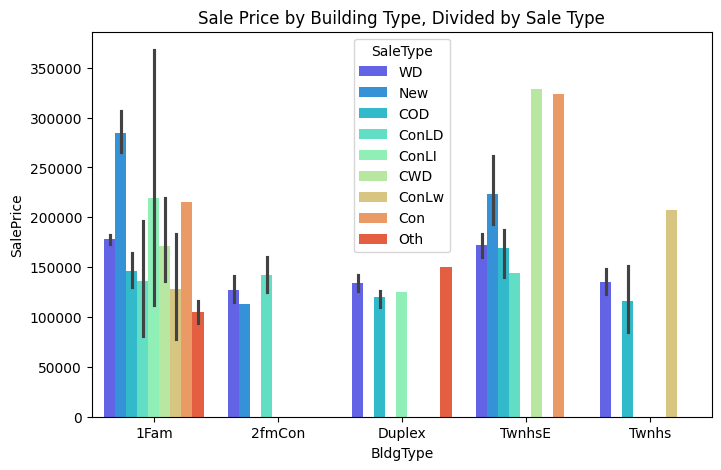

In [83]:
# sale type in relation to bdg type

plt.figure(figsize=(8,5))
sns.barplot(x='BldgType',y='SalePrice',data=train_data, palette='rainbow', hue='SaleType')
plt.title("Sale Price by Building Type, Divided by Sale Type")

<Axes: xlabel='BldgType', ylabel='count'>

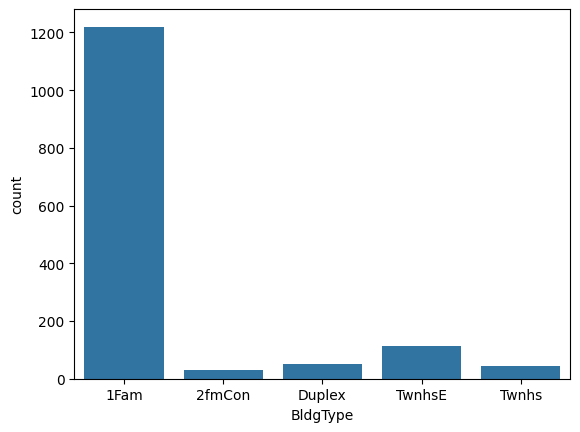

In [98]:
sns.countplot(x='BldgType',data=train_data)


Text(0.5, 1.0, 'Property Sale Price by Exterior Condition')

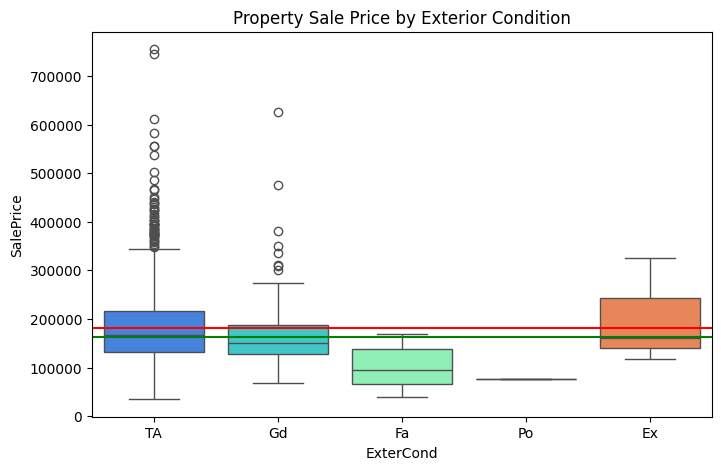

In [88]:
# sale price by exterior condition

plt.figure(figsize=(8,5))
sns.boxplot(x='ExterCond', y='SalePrice', data=train_data, palette='rainbow', hue='ExterCond', legend=False)
plt.axhline(y=market_value_mean, color='r', linestyle='-')
plt.axhline(y=market_value_med, color='g', linestyle='-')
plt.title('Property Sale Price by Exterior Condition')

Text(0.5, 1.0, 'Sale Price by Neighborhood, Divided by Year Sold')

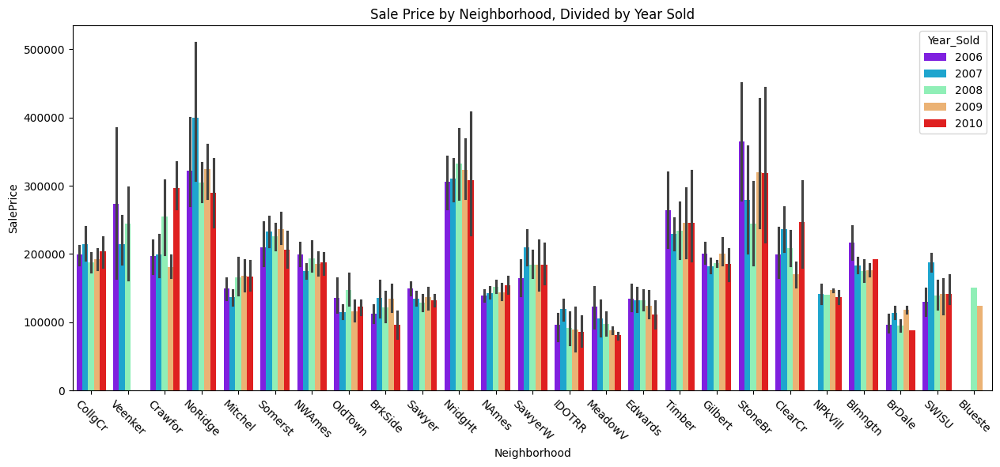

In [92]:
# sale price by neighborhood and yr
plt.figure(figsize=(15,6))
sns.barplot(x='Neighborhood',y='SalePrice',data=train_data, palette='rainbow', hue='Year_Sold')
plt.xticks(rotation=-45)
plt.title("Sale Price by Neighborhood, Divided by Year Sold")

Text(0.5, 1.0, 'Property Sale Price in relation to Proximity to Rail or Road links')

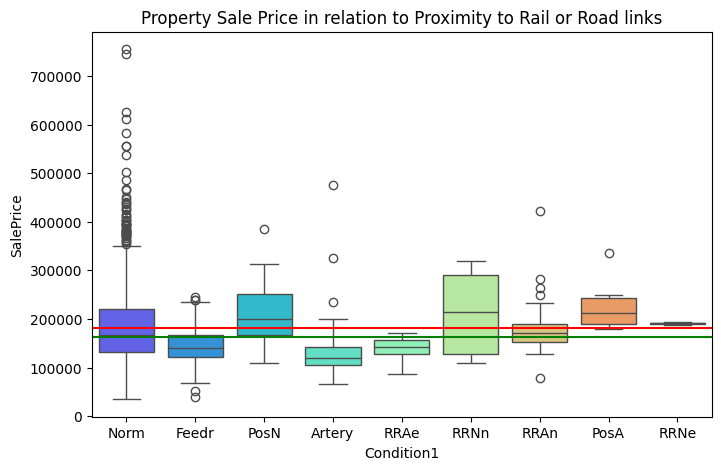

In [95]:
# proximity to rail or road and price 
plt.figure(figsize=(8,5))
sns.boxplot(x='Condition1', y='SalePrice', data=train_data, palette='rainbow', hue='Condition1', legend=False)
plt.axhline(y=market_value_mean, color='r', linestyle='-')
plt.axhline(y=market_value_med, color='g', linestyle='-')
plt.title('Property Sale Price in relation to Proximity to Rail or Road links')

Proximity to rail or road :- 

- Artery:	Adjacent to arterial street
- Feedr:	Adjacent to feeder street	
- Norm:	Normal	
- RRNn:	Within 200' of North-South Railroad
- RRAn:	Adjacent to North-South Railroad
- PosN:	Near positive off-site feature--park, greenbelt, etc.
- PosA:	Adjacent to postive off-site feature
- RRNe:	Within 200' of East-West Railroad
- RRAe:	Adjacent to East-West Railroad

The above box plots suggest:- 
    
    1. Very few properties are within 200' of East-West Railroad
    2. Higher sale prices are achieved for properties located in the following locations:-
        - Near positive off-site feature--park, greenbelt, etc.
        - Within 200' of North-South Railroad
        - Adjacent to postive off-site feature
    3. Properties located in the following locations achieved a lower sale price:- 
    - Adjacent to feeder street
    - Adjacent to arterial street
    - Adjacent to East-West Railroad

<Axes: xlabel='Condition1', ylabel='count'>

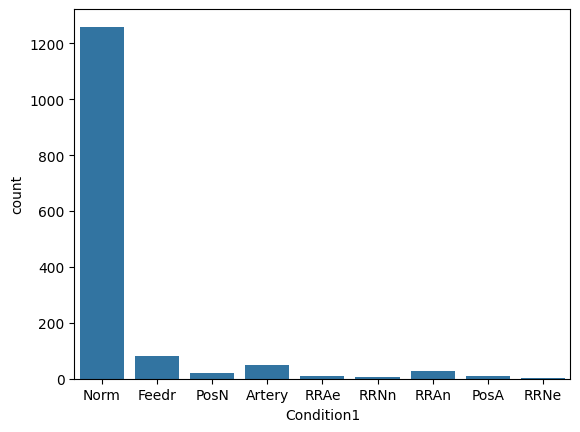

In [96]:
sns.countplot(x='Condition1',data=train_data)


Text(0, 0.5, 'SalePrice')

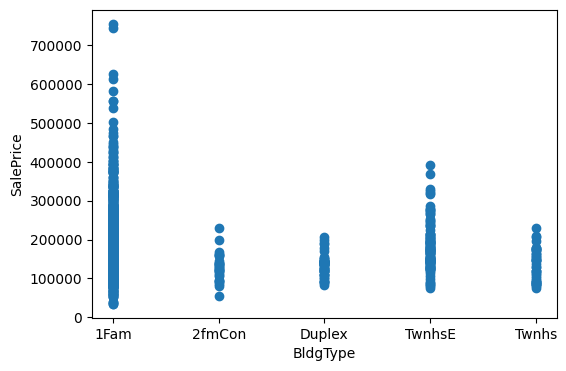

In [99]:
plt.figure(figsize=(6,4))
plt.scatter(x='BldgType',y='SalePrice',data=train_data)
plt.xlabel('BldgType')
plt.ylabel('SalePrice')

Text(0, 0.5, 'SalePrice')

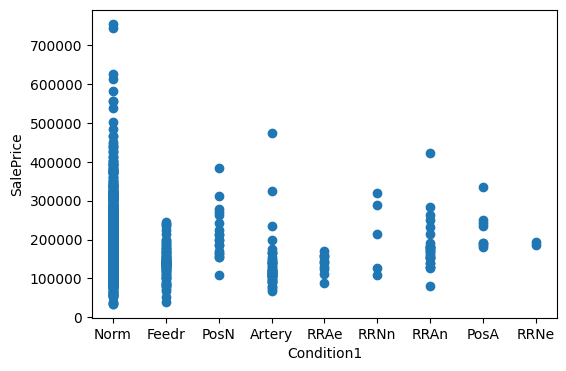

In [100]:
plt.figure(figsize=(6,4))
plt.scatter(x='Condition1',y='SalePrice',data=train_data)
plt.xlabel('Condition1')
plt.ylabel('SalePrice')

### Feature Selection

Based on the EDA I think it's wise to include the following features in the ML model:-

- GF living area
- Total Basement Sq/ft
- First Floor Sq/ft
- Garage Car capacity
- Garage Area
- Year Built
- Month sold
- Year sold 
- Neighborhood
- Overall Quality score
- Condition1 (proximity to rail or road)


### Model Selection 

Given that we are trying to predict future property sale prices, this is a regression problem. 

Regression is  a supervised learning type of problem. There are various types of regression models we could consider, to name a few:- 

1. Linear regression: Assumes a linear relationship between the input features and the target variable. 
2. Decision Tree Regression: Builds a decision tree to recursively partition the feature space into smaller regions.
3. Random Forest Regression: An ensemble learning method that combines multiple decision trees. Provides better generalisation performance compared to a single decision tree.
4. Gradient Boosting Regression: Another ensemble learning method where trees are built sequentially, with each tree correcting the errors of the previous ones. (e.g. XGBoost, LightBGM) 

Let's begin with a simple model, Linear Regression.

### Linear Regression Model 

In [104]:
a=train_data[['YrSold', 'MoSold', 'SalePrice']]
a.head()

,YrSold,MoSold,SalePrice
0,2008-01-01,2,208500
1,2007-01-01,5,181500
2,2008-01-01,9,223500
3,2006-01-01,2,140000
4,2008-01-01,12,250000


In [148]:
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PropAge,Year_Sold
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003-01-01,2003-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008-01-01,WD,Normal,208500,5,2008
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976-01-01,1976-01-01,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007-01-01,WD,Normal,181500,31,2007
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001-01-01,2002-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008-01-01,WD,Normal,223500,7,2008
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915-01-01,1970-01-01,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006-01-01,WD,Abnorml,140000,91,2006
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000-01-01,2000-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008-01-01,WD,Normal,250000,8,2008


In [149]:
df = train_data[['Id', 'Neighborhood', 'Condition1', 'OverallQual', 'YearBuilt', 'TotalBsmtSF',
               '1stFlrSF', 'GrLivArea', 'GarageCars', 'GarageArea', 'MoSold', 'YrSold']]
y = train_data['SalePrice']

In [150]:
df.dtypes

Id                       int64
Neighborhood            object
Condition1              object
OverallQual              int64
YearBuilt       datetime64[ns]
TotalBsmtSF              int64
1stFlrSF                 int64
GrLivArea                int64
GarageCars               int64
GarageArea               int64
MoSold                   int64
YrSold          datetime64[ns]
dtype: object

In [151]:
#encode categorical data neighborhood and condition1 (proximity to rail/road)
one_hot = pd.get_dummies(df[['Neighborhood', 'Condition1']])
X = pd.concat([df, one_hot], axis=1)
X = X.drop(columns=['Neighborhood', 'Condition1'], axis=1)

In [152]:
X['Year_built'] = X['YearBuilt'].dt.year
X['Year_sold'] = X['YrSold'].dt.year

In [153]:
X = X.drop(columns=['YearBuilt', 'YrSold'], axis=1)

In [154]:
X.head()

,Id,OverallQual,TotalBsmtSF,1stFlrSF,GrLivArea,GarageCars,GarageArea,MoSold,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Year_built,Year_sold
0,1,7,856,856,1710,2,548,2,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,2003,2008
1,2,6,1262,1262,1262,2,460,5,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,1976,2007
2,3,7,920,920,1786,2,608,9,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,2001,2008
3,4,7,756,961,1717,3,642,2,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,1915,2006
4,5,8,1145,1145,2198,3,836,12,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,2000,2008


In [155]:
# train model

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_log_error

#split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model = LinearRegression(fit_intercept=False).fit(X_train, y_train)
y_fit = pd.Series(model.predict(X_train), index=X_train.index).clip(0.0)
y_pred = pd.Series(model.predict(X_test), index=X_test.index).clip(0.0)

rmsle_train = mean_squared_log_error(y_train, y_fit) ** 0.5
rmsle_test = mean_squared_log_error(y_test, y_pred) ** 0.5

In [156]:
print(f'Training RMSLE: {rmsle_train: 5f}')
print(f'Testing RMSLE: {rmsle_test: 5f}')

Training RMSLE:  0.375374
Testing RMSLE:  0.172542


The test data has a RMSLE of 0.17 which indicates good performance by the Linear Regression Model.


In [157]:
from sklearn.metrics import mean_absolute_error
print(mean_absolute_error(y_test, y_pred))

21906.453459818877


The mean absolute error is 21,906 which reinforces the RMSLE performance value.

### Let's apply LR to the test data ... 

In [170]:
test_data = pd.read_csv(r"C:\Users\Krupa\Downloads\test.csv")
test_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [171]:
#re-shape test data to suit evaluation 

df1 = test_data[['Id', 'Neighborhood', 'Condition1', 'OverallQual', 'YearBuilt', 'TotalBsmtSF',
               '1stFlrSF', 'GrLivArea', 'GarageCars', 'GarageArea', 'MoSold', 'YrSold']]
property_id = test_data['Id']


In [172]:
df1.dtypes

Id                int64
Neighborhood     object
Condition1       object
OverallQual       int64
YearBuilt         int64
TotalBsmtSF     float64
1stFlrSF          int64
GrLivArea         int64
GarageCars      float64
GarageArea      float64
MoSold            int64
YrSold            int64
dtype: object

In [173]:
# encode categorical data 
one_hot = pd.get_dummies(df1[['Neighborhood', 'Condition1']])
X = pd.concat([df1, one_hot], axis=1)
X = X.drop(columns=['Neighborhood', 'Condition1'], axis=1)


In [174]:
X['YearBuilt'] = pd.to_datetime(X['YearBuilt'], format='%Y')
X['YrSold'] = pd.to_datetime(X['YrSold'], format='%Y')


In [175]:
X['Year_built'] = X['YearBuilt'].dt.year
X['Year_sold'] = X['YrSold'].dt.year
X = X.drop(columns=['YearBuilt', 'YrSold'], axis=1)
X.head()

,Id,OverallQual,TotalBsmtSF,1stFlrSF,GrLivArea,GarageCars,GarageArea,MoSold,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Year_built,Year_sold
0,1461,5,882.0,896,896,1.0,730.0,6,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,1961,2010
1,1462,6,1329.0,1329,1329,1.0,312.0,6,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,1958,2010
2,1463,5,928.0,928,1629,2.0,482.0,3,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,1997,2010
3,1464,6,926.0,926,1604,2.0,470.0,6,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,1998,2010
4,1465,8,1280.0,1280,1280,2.0,506.0,1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,1992,2010


In [176]:
X.count()

Id                      1459
OverallQual             1459
TotalBsmtSF             1458
1stFlrSF                1459
GrLivArea               1459
GarageCars              1458
GarageArea              1458
MoSold                  1459
Neighborhood_Blmngtn    1459
Neighborhood_Blueste    1459
Neighborhood_BrDale     1459
Neighborhood_BrkSide    1459
Neighborhood_ClearCr    1459
Neighborhood_CollgCr    1459
Neighborhood_Crawfor    1459
Neighborhood_Edwards    1459
Neighborhood_Gilbert    1459
Neighborhood_IDOTRR     1459
Neighborhood_MeadowV    1459
Neighborhood_Mitchel    1459
Neighborhood_NAmes      1459
Neighborhood_NPkVill    1459
Neighborhood_NWAmes     1459
Neighborhood_NoRidge    1459
Neighborhood_NridgHt    1459
Neighborhood_OldTown    1459
Neighborhood_SWISU      1459
Neighborhood_Sawyer     1459
Neighborhood_SawyerW    1459
Neighborhood_Somerst    1459
Neighborhood_StoneBr    1459
Neighborhood_Timber     1459
Neighborhood_Veenker    1459
Condition1_Artery       1459
Condition1_Fee

In [177]:
X.fillna(0, inplace=True)

In [178]:
X.count()

Id                      1459
OverallQual             1459
TotalBsmtSF             1459
1stFlrSF                1459
GrLivArea               1459
GarageCars              1459
GarageArea              1459
MoSold                  1459
Neighborhood_Blmngtn    1459
Neighborhood_Blueste    1459
Neighborhood_BrDale     1459
Neighborhood_BrkSide    1459
Neighborhood_ClearCr    1459
Neighborhood_CollgCr    1459
Neighborhood_Crawfor    1459
Neighborhood_Edwards    1459
Neighborhood_Gilbert    1459
Neighborhood_IDOTRR     1459
Neighborhood_MeadowV    1459
Neighborhood_Mitchel    1459
Neighborhood_NAmes      1459
Neighborhood_NPkVill    1459
Neighborhood_NWAmes     1459
Neighborhood_NoRidge    1459
Neighborhood_NridgHt    1459
Neighborhood_OldTown    1459
Neighborhood_SWISU      1459
Neighborhood_Sawyer     1459
Neighborhood_SawyerW    1459
Neighborhood_Somerst    1459
Neighborhood_StoneBr    1459
Neighborhood_Timber     1459
Neighborhood_Veenker    1459
Condition1_Artery       1459
Condition1_Fee

In [179]:
test_predictions = model.predict(X)
output_df = pd.DataFrame({'Id': property_id, 'SalePrice':test_predictions})


In [180]:
output_df.head()

,Id,SalePrice
0,1461,100008.152
1,1462,156297.033
2,1463,171121.064
3,1464,185391.783
4,1465,266587.423


In [182]:
output_df.to_csv('submission.csv', index=False)
